In [25]:
import matplotlib.pyplot as plt
import numpy as np
import imgaug as ia
from imgaug import augmenters as iaa
from imgaug import parameters as iap
from imgaug.augmentables.segmaps import SegmentationMapsOnImage

In [26]:
image = ia.quokka(size=(128, 128), extract="square")

In [27]:
# Define an example segmentation map (int32, 128x128).
# Here, we arbitrarily place some squares on the image.
# Class 0 is our intended background class.
segmap = np.zeros((128, 128, 1), dtype=np.int32)
segmap[28:71, 35:85, 0] = 1
segmap[10:25, 30:45, 0] = 2
segmap[10:25, 70:85, 0] = 3
segmap[10:110, 5:10, 0] = 4
segmap[118:123, 10:110, 0] = 5
segmap = SegmentationMapsOnImage(segmap, shape=image.shape)

In [28]:
# Define our augmentation pipeline.
seq = iaa.Sequential([
    iaa.SomeOf((0,1),[
            iaa.BlendAlphaFrequencyNoise(
                foreground=iaa.EdgeDetect(1.0),
                per_channel=True
            ),
            iaa.ElasticTransformation(alpha=50, sigma=5),  # apply water effect (affects segmaps)
            
            iaa.ReplaceElementwise(
                iap.FromLowerResolution(
                    iap.Binomial(0.1), size_px=8
                ),
                iap.Normal(128, 0.4*128),
                per_channel=0.5
            )
        ]
    ),
    iaa.PiecewiseAffine(scale=iap.Absolute(iap.Normal(0, 0.1))),
    iaa.Sharpen((0.0, 1.0)),       # sharpen the image
    iaa.Affine(
        rotate=(-45, 45),
        mode="edge"
    )  # rotate by -45 to 45 degrees (affects segmaps)

], random_order=True)

In [29]:
# Augment images and segmaps.
images_aug = []
segmaps_aug = []
for _ in range(40):
    images_aug_i, segmaps_aug_i = seq(image=image, segmentation_maps=segmap)
    images_aug.append(images_aug_i)
    segmaps_aug.append(segmaps_aug_i)

(-0.5, 1023.5, 639.5, -0.5)

<Figure size 432x288 with 0 Axes>

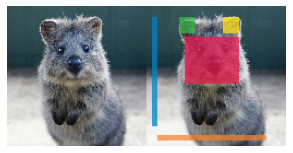

<Figure size 432x288 with 0 Axes>

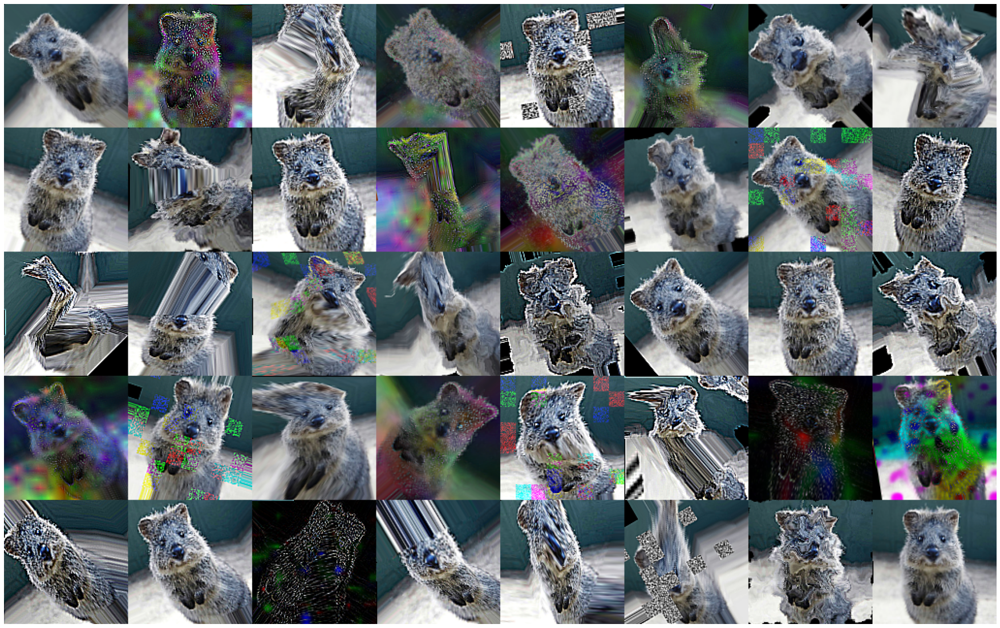

In [30]:
original = []
original.append(image)                                        
original.append(segmap.draw_on_image(image)[0])
original_grid_image = ia.draw_grid(original, cols=2)

cells = []
for image_aug, segmap_aug in zip(images_aug, segmaps_aug):
    cells.append(image_aug)                                     
    #cells.append(segmap_aug.draw_on_image(image_aug)[0])        
    #cells.append(segmap_aug.draw(size=image_aug.shape[:2])[0])  

# Convert cells to a grid image and save.
result_grid_image = ia.draw_grid(cells, cols=8)

#----------------------------------------------------------------------------------------------------------
# plot functions ------------------------------------------------------------------------------------------
# note that the last image is augmented by matplotlib to make classes distingushable
plt.figure()
f, window = plt.subplots(1,1,figsize=(5,10)) 
window.imshow(original_grid_image)
window.axis('off')

plt.figure()
f, window = plt.subplots(1,1,figsize=(40,20)) 
window.imshow(result_grid_image)
window.axis('off')